# K-Means Clustering Experiments

This notebook is dedicated to k-means experiments on silhouette features.

Includes:
- feature loading and explicit feature selection
- weighted preprocessing (`t*`/`b*` downweighting)
- k-means fitting and metrics
- density plots and PCA view
- stacked outline overlays by cluster
- parameter sweep helpers

In [1]:
import math
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.decomposition import PCA

In [2]:
REPO_ROOT = Path.cwd().resolve()
FEATURE_CSV = REPO_ROOT / "process_data/features/silhouette_features.csv"
REAL_IMAGES_DIR = REPO_ROOT / "process_data/real_images"

# Default weights
LR_W = 1.0
TB_W = 0.35
SHAPE_W = 1.0
INNER_W = 1.0

# KMeans defaults
N_CLUSTERS = 12
RANDOM_STATE = 42
N_INIT = "auto"

FEATURE_CSV, REAL_IMAGES_DIR

(PosixPath('/Users/oliviakasmin/Desktop/okasmin-parsons-thesis-2026/process_data/cluster/process_data/features/silhouette_features.csv'),
 PosixPath('/Users/oliviakasmin/Desktop/okasmin-parsons-thesis-2026/process_data/cluster/process_data/real_images'))

In [3]:
def load_feature_table(feature_csv: Path) -> pd.DataFrame:
    df = pd.read_csv(feature_csv)
    df["object_id"] = df["object_id"].astype(str)
    return df


def get_feature_groups(df: pd.DataFrame):
    # Explicit feature selection to avoid accidental inclusion of metadata columns.
    lr_cols = [c for c in df.columns if c.startswith("l") and c[1:].isdigit()]
    lr_cols += [c for c in df.columns if c.startswith("r") and c[1:].isdigit()]

    tb_cols = [c for c in df.columns if c.startswith("t") and c[1:].isdigit()]
    tb_cols += [c for c in df.columns if c.startswith("b") and c[1:].isdigit()]

    symmetry_cols = [
        c
        for c in [
            "lr_profile_abs_diff_mean",
            "eccentricity",
            "upper_vs_lower_width_ratio",
            "centroid_x_norm",
            "centroid_offset_x",
        ]
        if c in df.columns
    ]

    contour_cols = [
        c
        for c in df.columns
        if c.startswith("contour_") or c.startswith("convexity_")
    ]
    hu_cols = [c for c in df.columns if c.startswith("hu") and c[2:].isdigit()]
    inner_cols = [c for c in df.columns if c.startswith("inner")]

    shape_cols = list(dict.fromkeys(contour_cols + hu_cols + symmetry_cols))

    def only_numeric(cols):
        return [c for c in cols if pd.api.types.is_numeric_dtype(df[c])]

    return {
        "lr": only_numeric(lr_cols),
        "tb": only_numeric(tb_cols),
        "shape": only_numeric(shape_cols),
        "inner": only_numeric(inner_cols),
    }


def build_weighted_matrix(df: pd.DataFrame, groups: dict, lr_weight=LR_W, tb_weight=TB_W, shape_weight=SHAPE_W, inner_weight=INNER_W):
    cols = groups["lr"] + groups["tb"] + groups["shape"] + groups["inner"]
    X = df[cols].copy()

    imputer = SimpleImputer(strategy="median")
    X_imp = imputer.fit_transform(X)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_imp)

    weights = []
    for c in cols:
        if c in groups["lr"]:
            weights.append(lr_weight)
        elif c in groups["tb"]:
            weights.append(tb_weight)
        elif c in groups["inner"]:
            weights.append(inner_weight)
        else:
            weights.append(shape_weight)

    W = np.array(weights, dtype=float)
    X_weighted = X_scaled * W
    return X_weighted, cols, imputer, scaler, W

In [4]:
def fit_kmeans(X: np.ndarray, n_clusters: int = N_CLUSTERS, random_state: int = RANDOM_STATE, n_init=N_INIT):
    model = KMeans(n_clusters=n_clusters, random_state=random_state, n_init=n_init)
    labels = model.fit_predict(X)
    return model, labels


def evaluate_labels(X: np.ndarray, labels: np.ndarray) -> dict:
    labels = np.asarray(labels)
    unique = sorted(set(labels.tolist()))
    metrics = {
        "n_rows": int(X.shape[0]),
        "n_features": int(X.shape[1]),
        "n_clusters": len(unique),
    }

    if len(unique) >= 2 and X.shape[0] > len(unique):
        metrics["silhouette"] = float(silhouette_score(X, labels))
        metrics["calinski_harabasz"] = float(calinski_harabasz_score(X, labels))
        metrics["davies_bouldin"] = float(davies_bouldin_score(X, labels))
    else:
        metrics["silhouette"] = math.nan
        metrics["calinski_harabasz"] = math.nan
        metrics["davies_bouldin"] = math.nan
    return metrics


def attach_labels(df: pd.DataFrame, labels: np.ndarray) -> pd.DataFrame:
    out = df.copy()
    out["cluster"] = labels
    return out


def compute_cluster_compactness(X: np.ndarray, labels: np.ndarray) -> pd.DataFrame:
    rows = []
    for cluster_id in sorted(set(labels.tolist())):
        idx = np.where(labels == cluster_id)[0]
        Xc = X[idx]
        centroid = Xc.mean(axis=0)
        dists = np.linalg.norm(Xc - centroid, axis=1)
        rows.append({
            "cluster": int(cluster_id),
            "size": int(len(idx)),
            "mean_dist_to_centroid": float(np.mean(dists)),
            "median_dist_to_centroid": float(np.median(dists)),
            "p90_dist_to_centroid": float(np.percentile(dists, 90)),
        })
    return pd.DataFrame(rows).sort_values(by=["mean_dist_to_centroid", "p90_dist_to_centroid", "size"], ascending=[True, True, False])

In [5]:
def plot_cluster_sizes(df_labeled: pd.DataFrame):
    counts = df_labeled["cluster"].value_counts().sort_index()
    plt.figure(figsize=(10, 4))
    counts.plot(kind="bar")
    plt.title("Cluster Size Distribution")
    plt.xlabel("cluster")
    plt.ylabel("count")
    plt.tight_layout()
    plt.show()


def plot_feature_density_by_cluster(df_labeled: pd.DataFrame, feature: str, max_clusters: int = 8, bins: int = 60):
    ordered_clusters = df_labeled["cluster"].value_counts().index.tolist()[:max_clusters]
    plt.figure(figsize=(10, 5))
    for cid in ordered_clusters:
        vals = df_labeled.loc[df_labeled["cluster"] == cid, feature].dropna()
        if len(vals) == 0:
            continue
        plt.hist(vals, bins=bins, alpha=0.3, density=True, label=f"cluster {cid}")
    plt.title(f"Density by Cluster: {feature}")
    plt.xlabel(feature)
    plt.ylabel("density")
    plt.legend(loc="best", fontsize=8)
    plt.tight_layout()
    plt.show()


def plot_pca_projection(X: np.ndarray, labels: np.ndarray, title: str = "PCA Cluster Projection"):
    pca = PCA(n_components=2, random_state=42)
    points = pca.fit_transform(X)
    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(points[:, 0], points[:, 1], c=labels, s=10, cmap="tab20", alpha=0.85)
    plt.title(title)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.colorbar(scatter, label="cluster")
    plt.tight_layout()
    plt.show()


def stack_cluster_outlines(df_labeled: pd.DataFrame, cluster_id: int, real_images_dir: Path = REAL_IMAGES_DIR, max_images: int | None = None, alpha_per_image: float = 0.08):
    rows = df_labeled[df_labeled["cluster"] == cluster_id]
    if max_images is not None:
        rows = rows.head(max_images)

    overlays = []
    for oid in rows["object_id"].astype(str):
        p = real_images_dir / f"{oid}_outline.png"
        if not p.exists():
            continue
        alpha = np.array(Image.open(p).convert("RGBA"), dtype=np.float32)[:, :, 3] / 255.0
        m = alpha.max()
        if m > 0:
            alpha = alpha / m
        overlays.append(alpha)

    if not overlays:
        print(f"No outline images for cluster {cluster_id}")
        return None

    stack = np.zeros_like(overlays[0], dtype=np.float32)
    for a in overlays:
        stack += alpha_per_image * a
    stack = np.clip(stack, 0.0, 1.0)

    plt.figure(figsize=(6, 6))
    plt.imshow(stack, cmap="magma")
    plt.title(f"Stacked Outlines - Cluster {cluster_id} (n={len(overlays)})")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    return stack

In [6]:
# ---- Main KMeans experiment ----

# tune these values and rerun this cell
K = 12
LR_W_RUN = 1.0
TB_W_RUN = 0.35
SHAPE_W_RUN = 1.0
INNER_W_RUN = 1.0

df = load_feature_table(FEATURE_CSV)
groups = get_feature_groups(df)
X, used_cols, imputer, scaler, W = build_weighted_matrix(
    df,
    groups,
    lr_weight=LR_W_RUN,
    tb_weight=TB_W_RUN,
    shape_weight=SHAPE_W_RUN,
    inner_weight=INNER_W_RUN,
)

kmeans_model, labels = fit_kmeans(X, n_clusters=K)
metrics = evaluate_labels(X, labels)
df_labeled = attach_labels(df, labels)
compactness = compute_cluster_compactness(X, labels)

print("KMeans metrics:")
print(metrics)

display(compactness)
plot_cluster_sizes(df_labeled)
plot_pca_projection(X, labels, title=f"KMeans PCA Projection (k={K})")

for f in ["contour_circularity", "contour_solidity", "eccentricity", "inner_area_ratio_to_outer"]:
    if f in df_labeled.columns:
        plot_feature_density_by_cluster(df_labeled, f, max_clusters=8)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/oliviakasmin/Desktop/okasmin-parsons-thesis-2026/process_data/cluster/process_data/features/silhouette_features.csv'

cluster=0, n=126


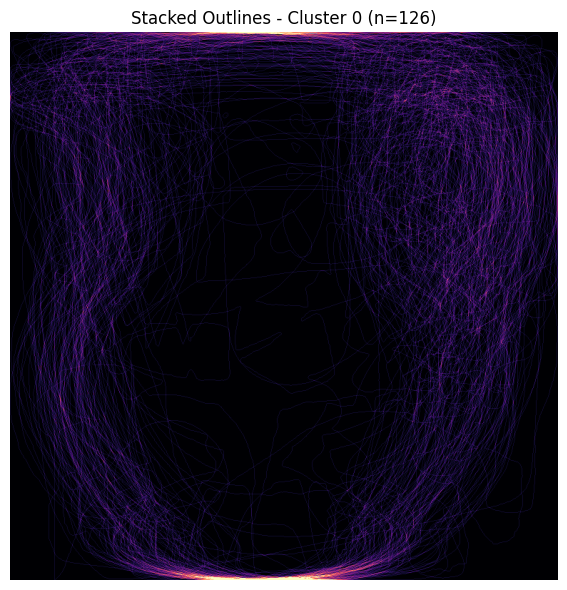

['188645', '188993', '188994', '193063', '193077', '193093', '193355', '194292', '194307', '194488', '194636', '194639', '194644', '195127', '195775', '196568', '197532', '197552', '197570', '197572', '197614', '197616', '198409', '198426', '198432', '198939', '199026', '199051', '199134', '199271', '199285', '199320', '199338', '199415', '199568', '199569', '199570', '199886', '201756', '201781']
cluster=1, n=680


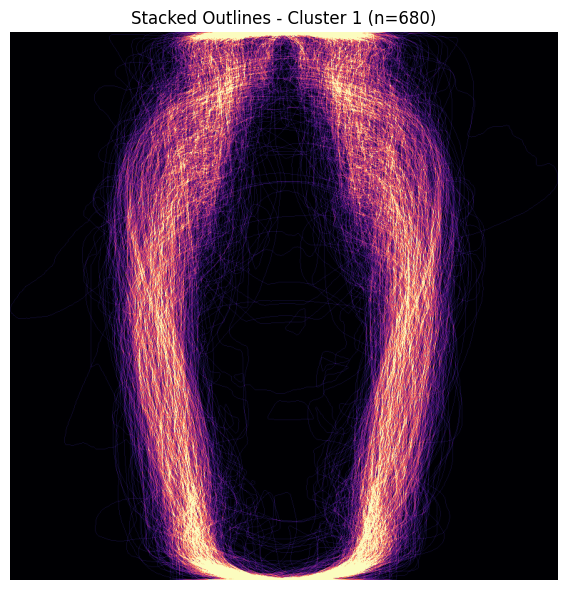

['187749', '187750', '187858', '188536', '188537', '188538', '188539', '188541', '188633', '188753', '188972', '190547', '190797', '191206', '191344', '191593', '191600', '191733', '191778', '191779', '194251', '194256', '194261', '194293', '194298', '194303', '194380', '194383', '194392', '194432', '194472', '194479', '194582', '194587', '194961', '195021', '195273', '196553', '196741', '197018']
cluster=2, n=397


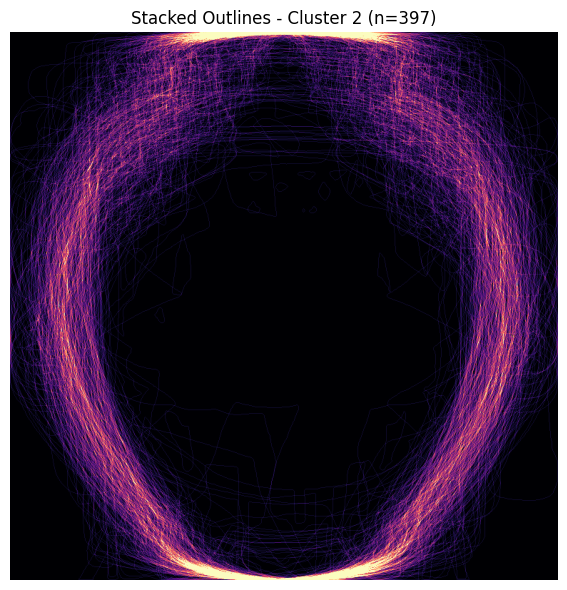

['187791', '188534', '188535', '188556', '191583', '192034', '193020', '193109', '194391', '196601', '198433', '199111', '199132', '199470', '199534', '199731', '200841', '202967', '205100', '206328', '207469', '207779', '208009', '208337', '239504', '307615', '308298', '308301', '308349', '308379', '308448', '308452', '308569', '308582', '308602', '308718', '309396', '309399', '309717', '309757']
cluster=3, n=393


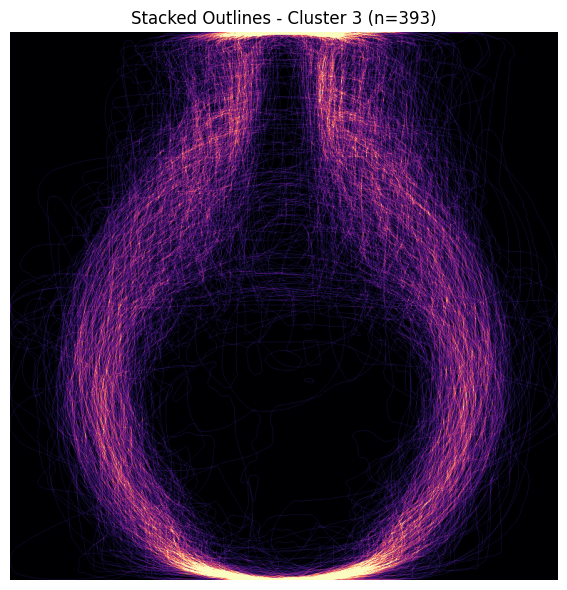

['185901', '188765', '188900', '190600', '190647', '194291', '194304', '194475', '194583', '194589', '194590', '195217', '197612', '197993', '198963', '199110', '200823', '200869', '200917', '200921', '200944', '201762', '202192', '202193', '202243', '202581', '204046', '204047', '204062', '205087', '205929', '205930', '205935', '207775', '207776', '207983', '208156', '208199', '208389', '208556']
cluster=4, n=273


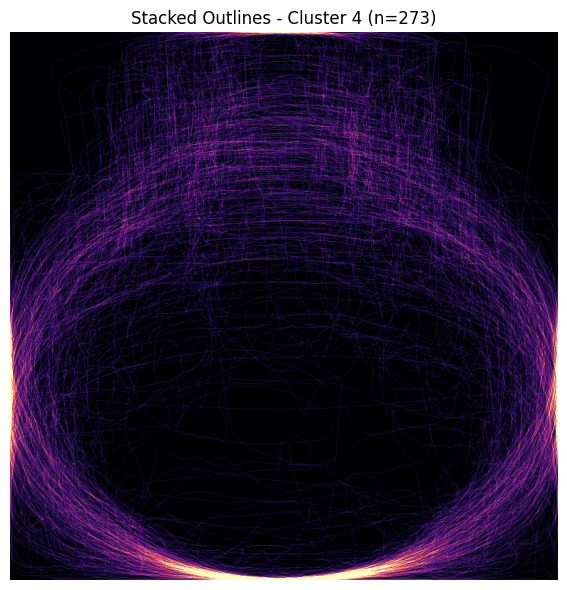

['187863', '192949', '199021', '199601', '200734', '200868', '201250', '201359', '201394', '201730', '201732', '202205', '203304', '205979', '206107', '207145', '207152', '207153', '207247', '207477', '208459', '307614', '307619', '307620', '307622', '307863', '307864', '307865', '307866', '307868', '308291', '308292', '308293', '308296', '308297', '308300', '308303', '308304', '308350', '308352']
cluster=5, n=404


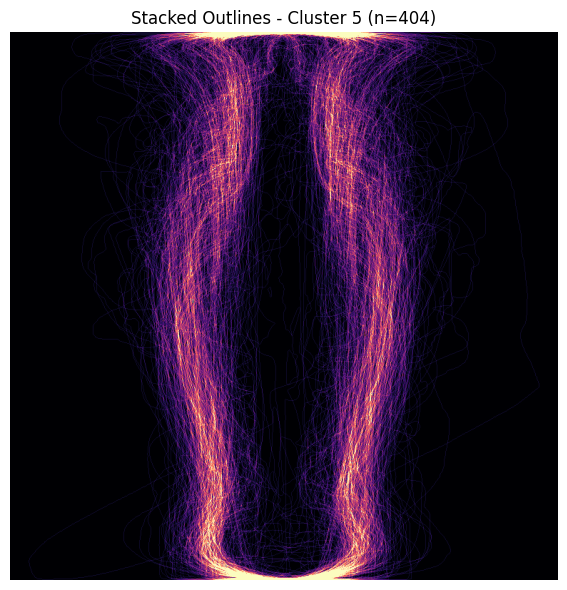

['187660', '187801', '187805', '187856', '187859', '188777', '190474', '191218', '191375', '191636', '192801', '192810', '192811', '192830', '192831', '192844', '192854', '193449', '194229', '194230', '194231', '194233', '194234', '194235', '194236', '194238', '194246', '194289', '194595', '195013', '196344', '197225', '198670', '199336', '199384', '200670', '200879', '200880', '200895', '200911']
cluster=6, n=430


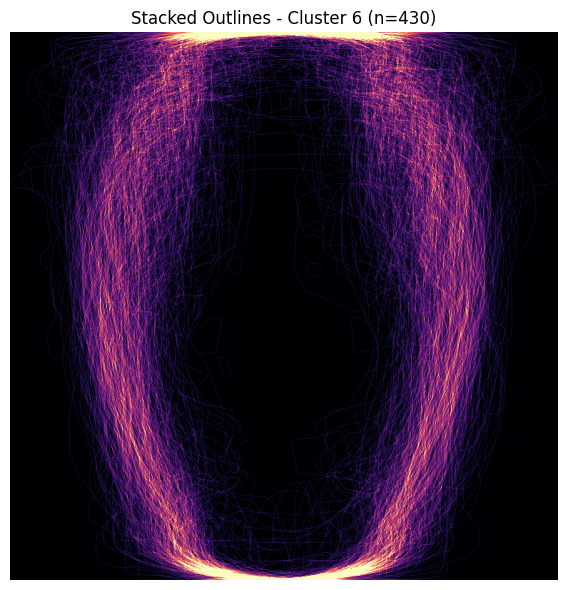

['185900', '185902', '187702', '187733', '187794', '187828', '187829', '187854', '187871', '188533', '188563', '188974', '188976', '188998', '190648', '190649', '190657', '192308', '192803', '193084', '194279', '194287', '194390', '194395', '194433', '194586', '194608', '194624', '194960', '194963', '194967', '195041', '195272', '195277', '195302', '195307', '195499', '195741', '195742', '195774']
cluster=7, n=611


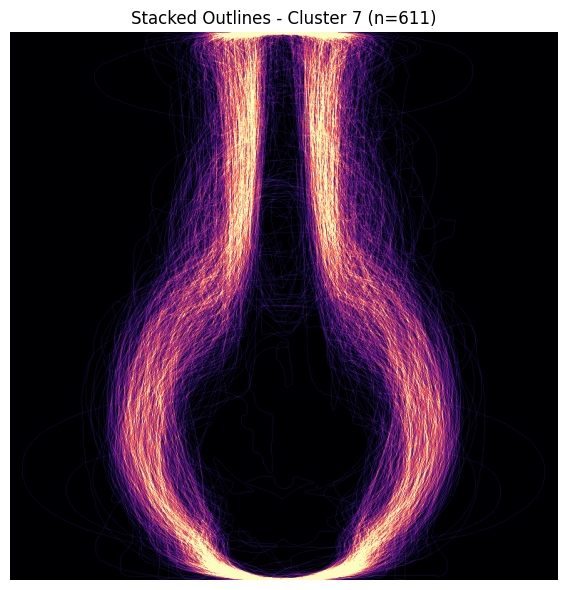

['187746', '187748', '190732', '191213', '192800', '192802', '194228', '194232', '194239', '194288', '194588', '195500', '195501', '196359', '196360', '196361', '196567', '197232', '197233', '197515', '197829', '198707', '199273', '199334', '199337', '199348', '199461', '199466', '199559', '199579', '199582', '200730', '200891', '201031', '201032', '201751', '201752', '203192', '203257', '204090']
cluster=8, n=48


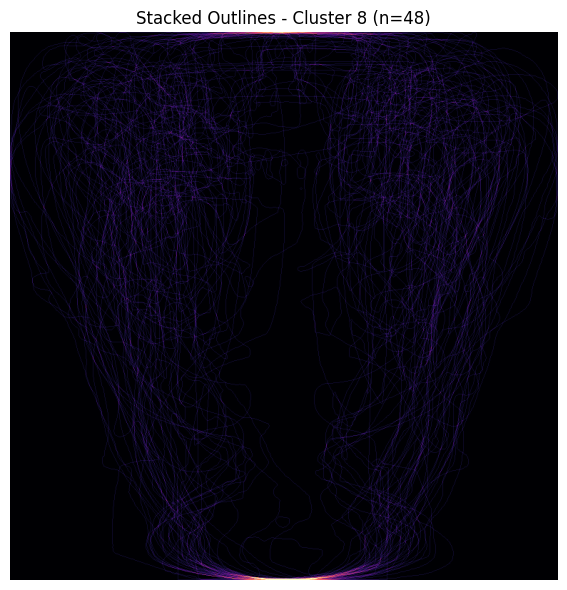

['186684', '187857', '187860', '188908', '191731', '194243', '194301', '194439', '194591', '195766', '196343', '198669', '199730', '199733', '199752', '202124', '203363', '203377', '204414', '204511', '204513', '206392', '206742', '207399', '208181', '444900', '44721', '449072', '449636', '452610', '45849', '460132', '460147', '460173', '460175', '460177', '460180', '460715', '460716', '46868']
cluster=9, n=88


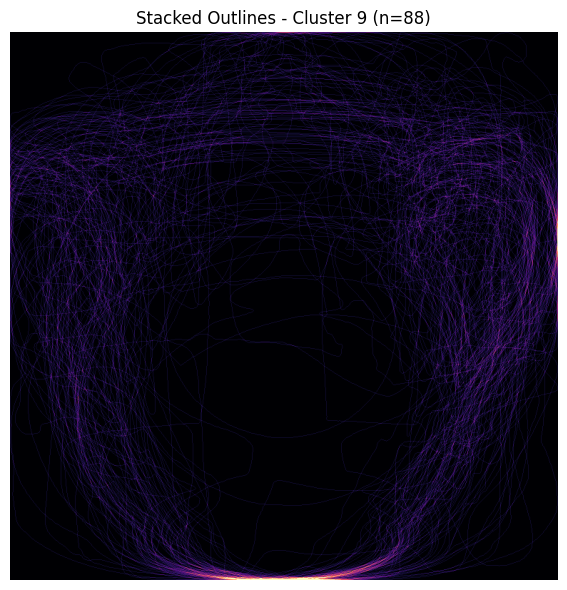

['191780', '192014', '193062', '193064', '194471', '194632', '194637', '194906', '198416', '198575', '199765', '201716', '203282', '204026', '204066', '204071', '204350', '204351', '204352', '204356', '204360', '204363', '204364', '204368', '204370', '204372', '204374', '204377', '204378', '204380', '204384', '204385', '204387', '204390', '204391', '204392', '204415', '204423', '204512', '205825']
cluster=10, n=335


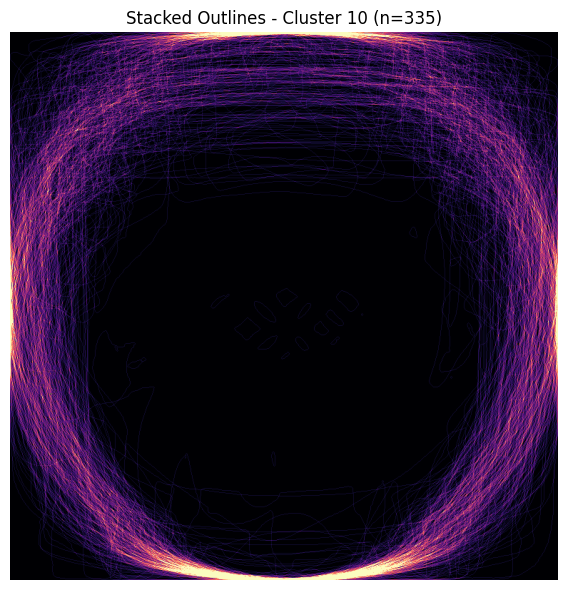

['195208', '195209', '198780', '198781', '199343', '199372', '199740', '200839', '200840', '200875', '200876', '201290', '201881', '202191', '203266', '206433', '207815', '208121', '208122', '208248', '208403', '208554', '308294', '308348', '308359', '308380', '308420', '308441', '308457', '308458', '308459', '308491', '308492', '308531', '308577', '308578', '308585', '308590', '308591', '308719']
cluster=11, n=103


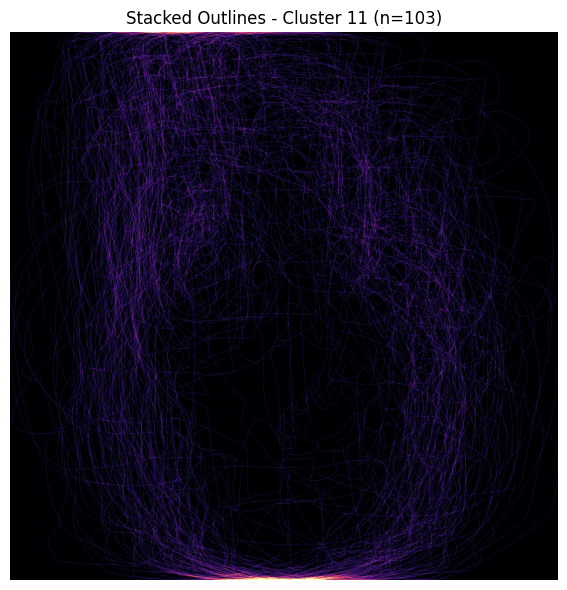

['185914', '186687', '187701', '191142', '194262', '195780', '197605', '199195', '199238', '199332', '199417', '200861', '201054', '201738', '203297', '203298', '204098', '205973', '206508', '206517', '207777', '208409', '208440', '208542', '307472', '308381', '308423', '308439', '308526', '308542', '308544', '308550', '308552', '308554', '308558', '308723', '309325', '309326', '309337', '309339']


In [ ]:
# ---- Inspect overlays for every cluster ----
MAX_STACK_IMAGES = None

all_clusters = sorted(df_labeled["cluster"].unique().tolist())
for cluster_id in all_clusters:
    print("=" * 80)
    print(f"cluster={cluster_id}, n={len(df_labeled[df_labeled['cluster'] == cluster_id])}")

    _ = stack_cluster_outlines(
        df_labeled,
        cluster_id=cluster_id,
        real_images_dir=REAL_IMAGES_DIR,
        max_images=MAX_STACK_IMAGES,
        alpha_per_image=0.08,
    )

    sample_ids = (
        df_labeled.loc[df_labeled["cluster"] == cluster_id, "object_id"]
        .astype(str)
        .head(40)
        .tolist()
    )
    print(sample_ids)

In [ ]:
# ---- KMeans sweep helper ----
# Compare a few k and weight configs quickly.

experiments = [
    {"k": 11, "tb_weight": 0.20},
    {"k": 11, "tb_weight": 0.35},
    {"k": 12, "tb_weight": 0.20},
    {"k": 12, "tb_weight": 0.35},
    {"k": 14, "tb_weight": 0.35},
]

rows = []
for exp in experiments:
    X_exp, _, _, _, _ = build_weighted_matrix(
        df,
        groups,
        lr_weight=1.0,
        tb_weight=exp["tb_weight"],
        shape_weight=1.0,
        inner_weight=1.0,
    )
    _, labels_exp = fit_kmeans(X_exp, n_clusters=exp["k"])
    m = evaluate_labels(X_exp, labels_exp)
    comp = compute_cluster_compactness(X_exp, labels_exp)
    tight_8_mean = float(comp.head(8)["mean_dist_to_centroid"].mean()) if len(comp) >= 8 else math.nan
    rows.append({**exp, **m, "top8_mean_dist": tight_8_mean})

pd.DataFrame(rows).sort_values(by=["silhouette", "davies_bouldin"], ascending=[False, True])

,k,tb_weight,n_rows,n_features,n_clusters,silhouette,calinski_harabasz,davies_bouldin,top8_mean_dist
0,11,0.20,3888,297,11,0.130555,528.487524,1.973193,7.695275
3,12,0.35,3888,297,12,0.121681,458.880398,2.097711,7.942768
2,12,0.20,3888,297,12,0.120817,495.850277,2.023081,7.206636
1,11,0.35,3888,297,11,0.118026,486.459385,2.153625,8.059106
4,14,0.35,3888,297,14,0.116427,413.527995,2.110388,7.420083


Overall config summary:


,name,k,tb_weight,n_rows,n_features,n_clusters,silhouette,calinski_harabasz,davies_bouldin,top8_mean_dist
0,k11_tb020,11,0.2,3888,297,11,0.130555,528.487524,1.973193,7.695275
1,k12_tb020,12,0.2,3888,297,12,0.120817,495.850277,2.023081,7.206636


Compactness/size comparison by rank (lower distance is tighter):


,k11_cluster,k11_size,k11_mean_dist,k11_median_dist,k11_p90_dist,rank,k12_cluster,k12_size,k12_mean_dist,k12_median_dist,k12_p90_dist
0,10.0,604.0,5.187413,4.839359,7.570179,1,10,599,5.149961,4.826860,7.552497
1,1.0,665.0,6.590001,5.844202,9.918921,2,1,645,6.168102,5.475331,9.535039
2,3.0,522.0,6.851664,5.757380,11.239815,3,3,402,7.096880,5.810900,12.178462
3,6.0,499.0,7.799345,6.944931,12.103793,4,11,399,7.181880,6.574131,10.866925
4,2.0,299.0,8.104290,7.612136,10.700499,5,6,382,7.831486,6.819063,11.899641
5,0.0,337.0,8.132197,7.659138,11.639869,6,2,241,7.940069,7.435940,10.831869
6,9.0,407.0,8.245810,7.174917,11.899283,7,0,279,8.052956,7.663716,11.669882
7,5.0,214.0,10.651481,9.191412,16.703164,8,9,395,8.231759,7.149364,11.970962
8,4.0,108.0,11.996226,11.285512,17.250560,9,5,211,10.733620,9.200034,16.667064
9,8.0,172.0,12.341181,11.670124,16.261951,10,4,101,12.231361,11.468572,17.267914



##########################################################################################
Overlay review for config: k11_tb020
Top compact clusters first:
config=k11_tb020, cluster=10, n=604


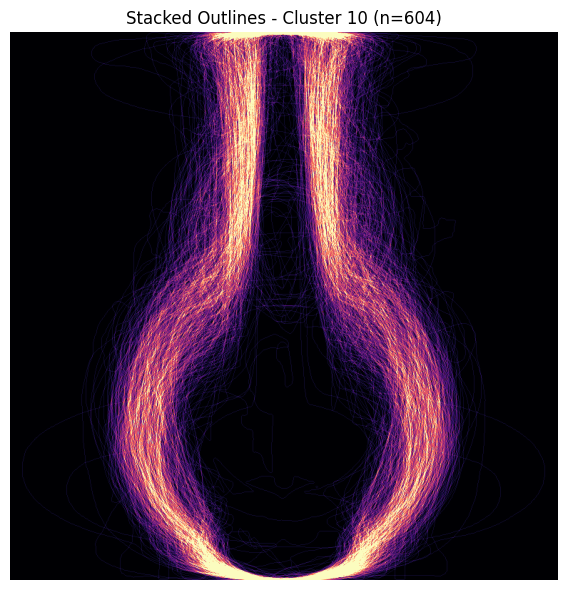

['187746', '187748', '190732', '191213', '192800', '192802', '194228', '194232', '194239', '195500', '195501', '196359', '196360', '196361', '196567', '197232', '197233', '197515', '197829', '198322', '198707', '199273', '199334', '199337', '199348', '199461', '199466', '199559', '199579', '199582']
config=k11_tb020, cluster=1, n=665


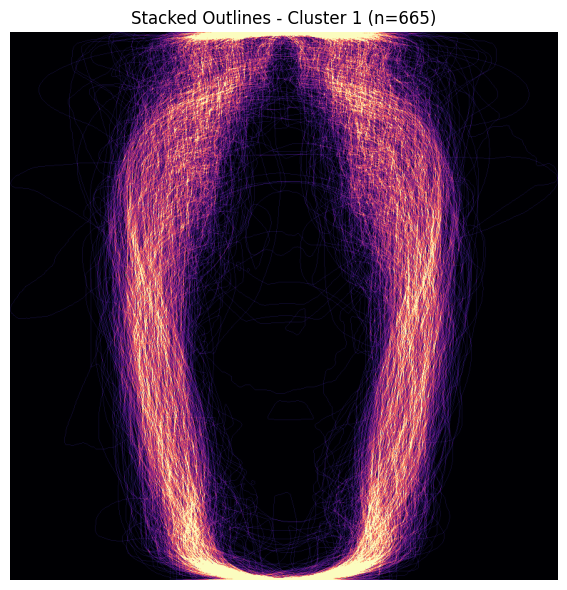

['187702', '187749', '187750', '187794', '188536', '188541', '188563', '188633', '188753', '188972', '190547', '190657', '191344', '191593', '191733', '191778', '191779', '193084', '194261', '194279', '194298', '194303', '194380', '194383', '194390', '194392', '194432', '194472', '194479', '194582']
config=k11_tb020, cluster=3, n=522


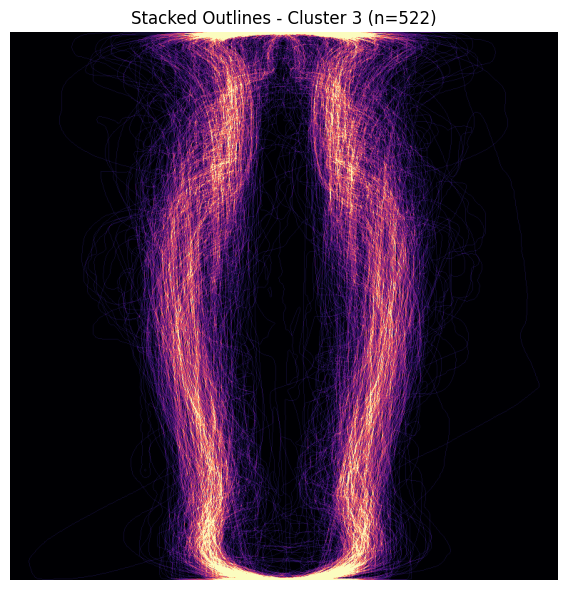

['187660', '187801', '187805', '187856', '187858', '187859', '188537', '188538', '188539', '188777', '190474', '190797', '191206', '191218', '191375', '191600', '191636', '192801', '192810', '192811', '192830', '192831', '192844', '192854', '193449', '194229', '194230', '194231', '194233', '194234']
config=k11_tb020, cluster=6, n=499


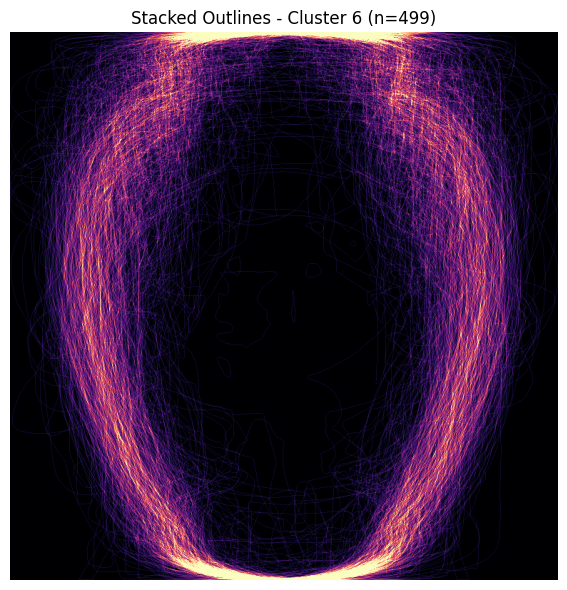

['185900', '185902', '187733', '187791', '187828', '187829', '187854', '187871', '188533', '188535', '188974', '188976', '188998', '190648', '190649', '192308', '192803', '193020', '193109', '194287', '194391', '194395', '194433', '194624', '194963', '195041', '195272', '195277', '195302', '195499']
config=k11_tb020, cluster=2, n=299


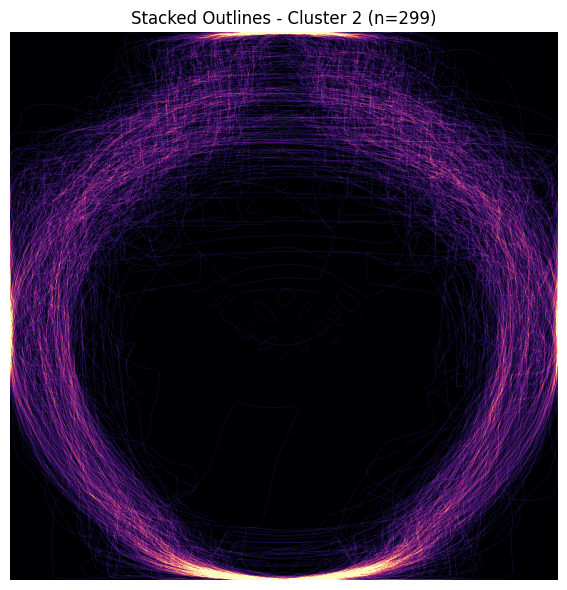

['188534', '191583', '191780', '192034', '193062', '194590', '195209', '199111', '199534', '200839', '200840', '200841', '201250', '201881', '202967', '203266', '203282', '204370', '204392', '204423', '206107', '206328', '206433', '207477', '207779', '208009', '208199', '208403', '208439', '210783']
config=k11_tb020, cluster=0, n=337


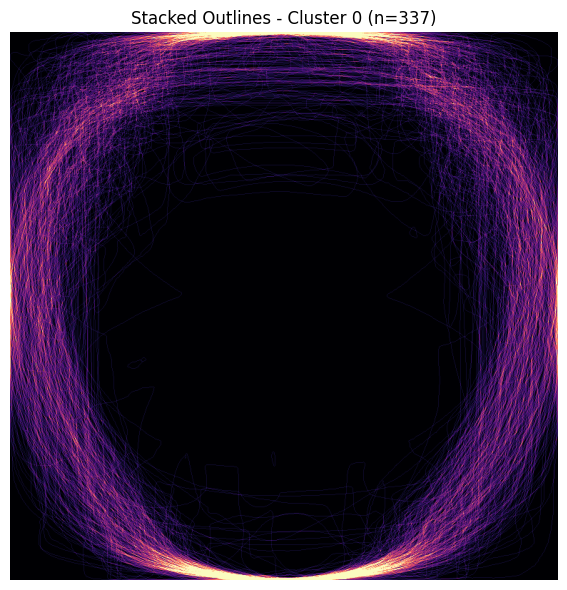

['188556', '195208', '198433', '198780', '198781', '199343', '199372', '199470', '199740', '200875', '200876', '201290', '201756', '202191', '207815', '208121', '208122', '208248', '208554', '307615', '308348', '308359', '308420', '308441', '308452', '308457', '308491', '308492', '308531', '308577']
config=k11_tb020, cluster=9, n=407


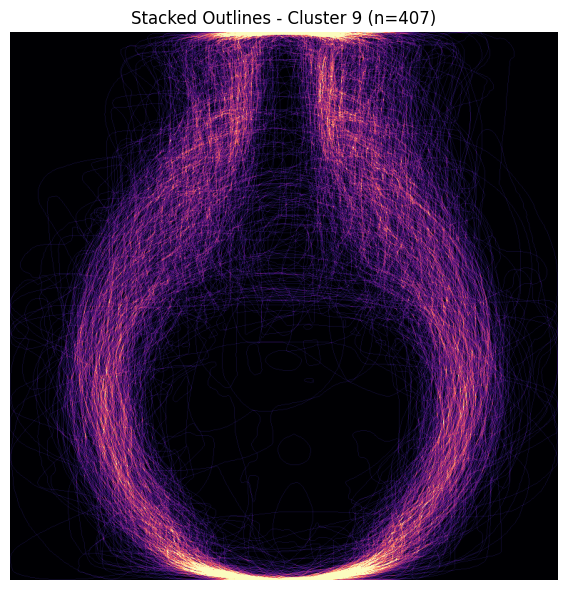

['188765', '188900', '190600', '190647', '194288', '194291', '194304', '194475', '194583', '194588', '194589', '195217', '197612', '197993', '198321', '198963', '199110', '200823', '200869', '200921', '200944', '201751', '201762', '202192', '202193', '202243', '202581', '203299', '204046', '204047']
config=k11_tb020, cluster=5, n=214


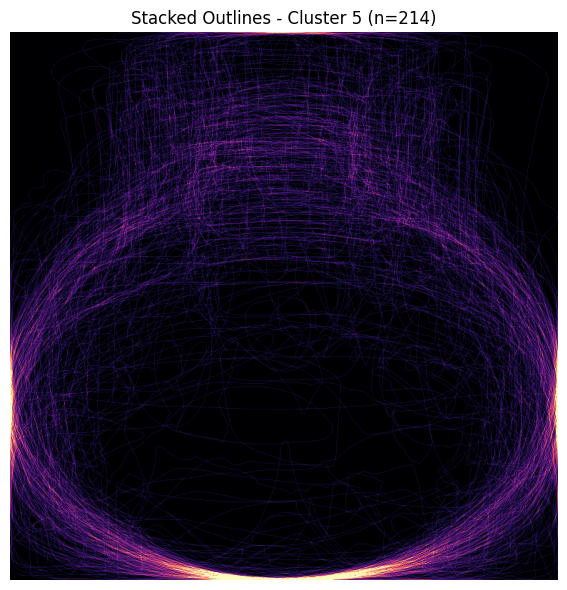

['187863', '192949', '199021', '199601', '200734', '200868', '201359', '201394', '201730', '201732', '202205', '203304', '205979', '207145', '207152', '207153', '207247', '208459', '307614', '307619', '307620', '307622', '307864', '307868', '308291', '308292', '308293', '308296', '308297', '308300']
config=k11_tb020, cluster=4, n=108


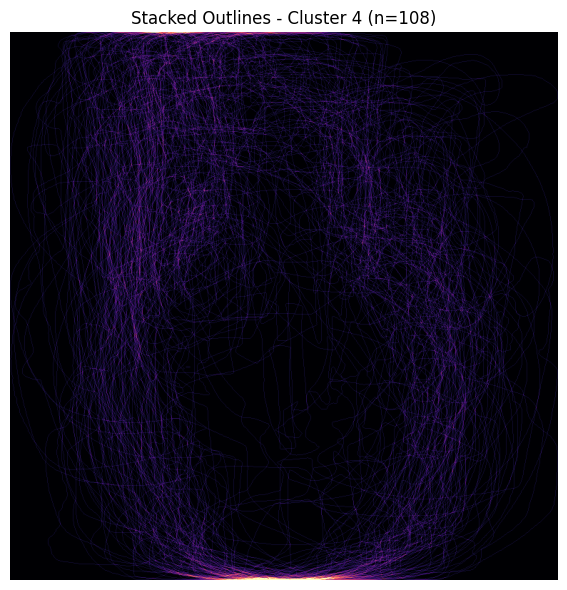

['185914', '186687', '187701', '191142', '194262', '195780', '197605', '199195', '199238', '199332', '199417', '200861', '201054', '201738', '202124', '203297', '203298', '203363', '204098', '205973', '206508', '206517', '207777', '208409', '208440', '208542', '307472', '308381', '308423', '308439']
config=k11_tb020, cluster=8, n=172


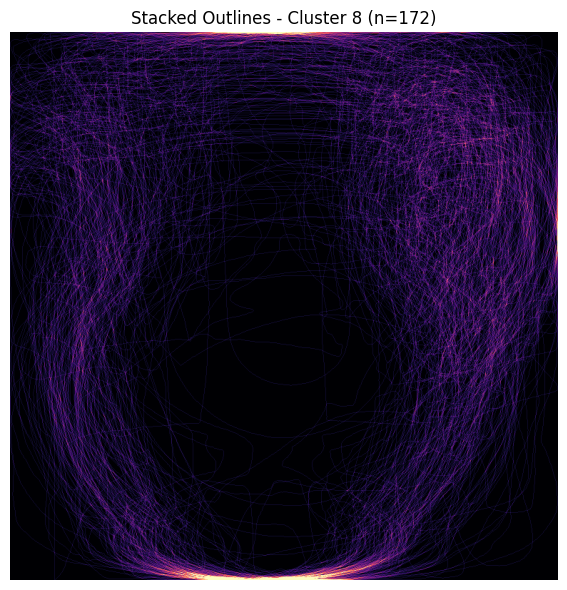

['188645', '188993', '188994', '192014', '193063', '193064', '193077', '193093', '193355', '194292', '194307', '194471', '194488', '194632', '194636', '194637', '194639', '194644', '194906', '195127', '195307', '195775', '197532', '197552', '197570', '197614', '197616', '198409', '198416', '198426']
config=k11_tb020, cluster=7, n=61


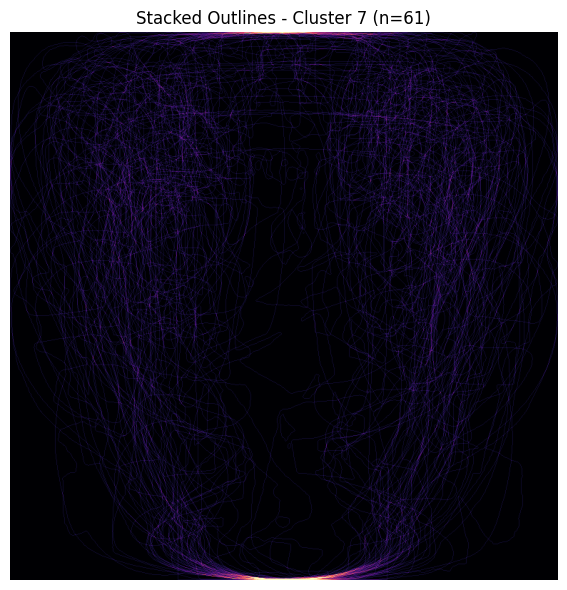

['185901', '186684', '187857', '187860', '188908', '191731', '194243', '194301', '194439', '194591', '195766', '196343', '196568', '197485', '198669', '198939', '199730', '199733', '199752', '203377', '204414', '204511', '204512', '204513', '206392', '206742', '207399', '208181', '39505', '39520']

##########################################################################################
Overlay review for config: k12_tb020
Top compact clusters first:
config=k12_tb020, cluster=10, n=599


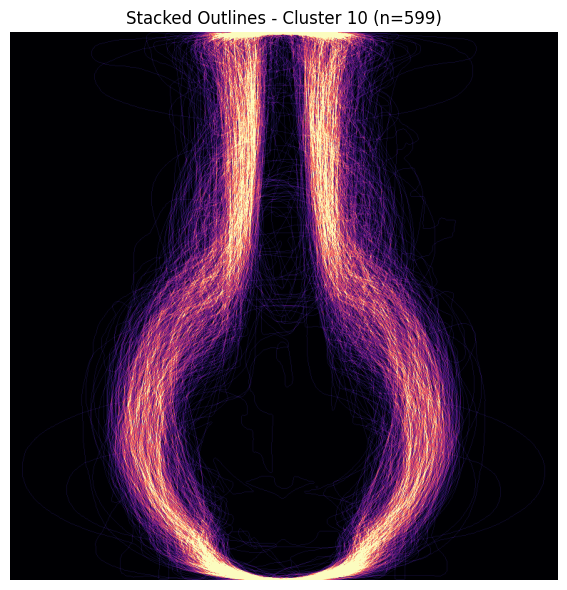

['187746', '187748', '190732', '191213', '192800', '192802', '194228', '194232', '194239', '194288', '195500', '195501', '196359', '196360', '196361', '196567', '197232', '197233', '197515', '197829', '198707', '199273', '199334', '199337', '199348', '199461', '199466', '199559', '199579', '199582']
config=k12_tb020, cluster=1, n=645


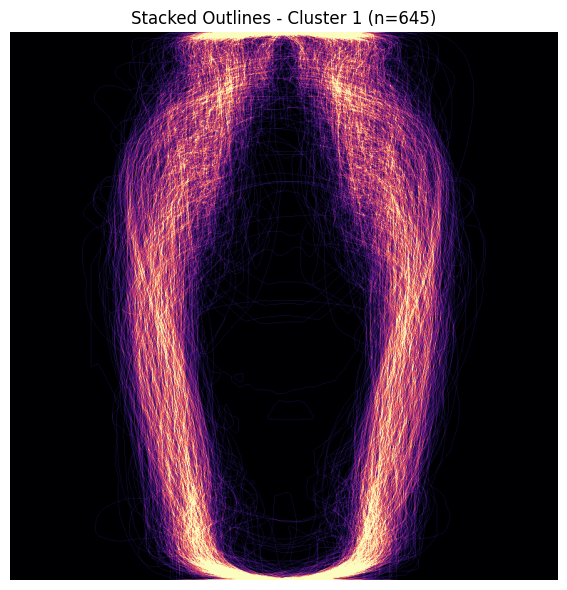

['187749', '187750', '187858', '188536', '188537', '188538', '188539', '188541', '188633', '188753', '188972', '190797', '191344', '191593', '191600', '191733', '191778', '194251', '194256', '194293', '194298', '194303', '194380', '194383', '194392', '194432', '194472', '194479', '194582', '194587']
config=k12_tb020, cluster=3, n=402


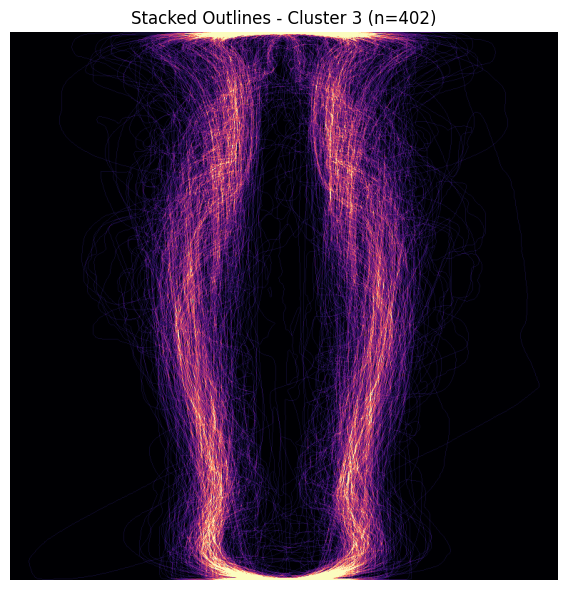

['187660', '187801', '187805', '187856', '187859', '188777', '190474', '191206', '191218', '191375', '191636', '192801', '192810', '192811', '192830', '192831', '192844', '192854', '193449', '194229', '194230', '194231', '194233', '194234', '194235', '194236', '194238', '194246', '194289', '194595']
config=k12_tb020, cluster=11, n=399


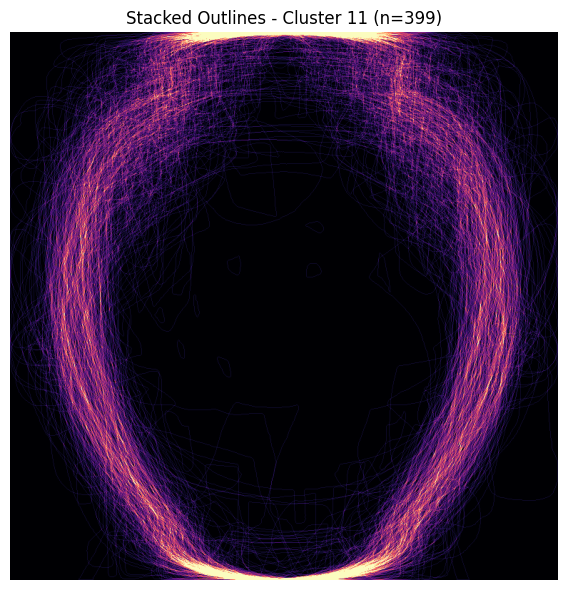

['185902', '187733', '187791', '188534', '188535', '188556', '188998', '190648', '191583', '192034', '193020', '193109', '194391', '194433', '194963', '196601', '197824', '198497', '198940', '199039', '199111', '199132', '199135', '199261', '199533', '199534', '199670', '199731', '199744', '199775']
config=k12_tb020, cluster=6, n=382


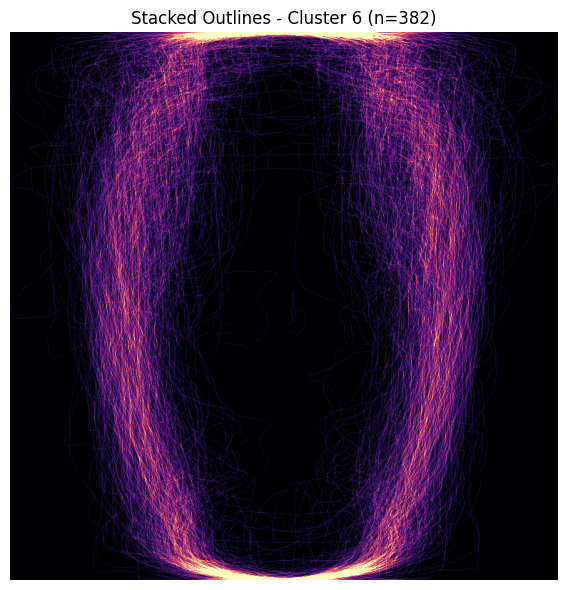

['185900', '186687', '187702', '187794', '187828', '187829', '187854', '187871', '188533', '188563', '188974', '188976', '190547', '190649', '190657', '191779', '192803', '193084', '194261', '194279', '194287', '194301', '194390', '194395', '194586', '194608', '194624', '194960', '194967', '195041']
config=k12_tb020, cluster=2, n=241


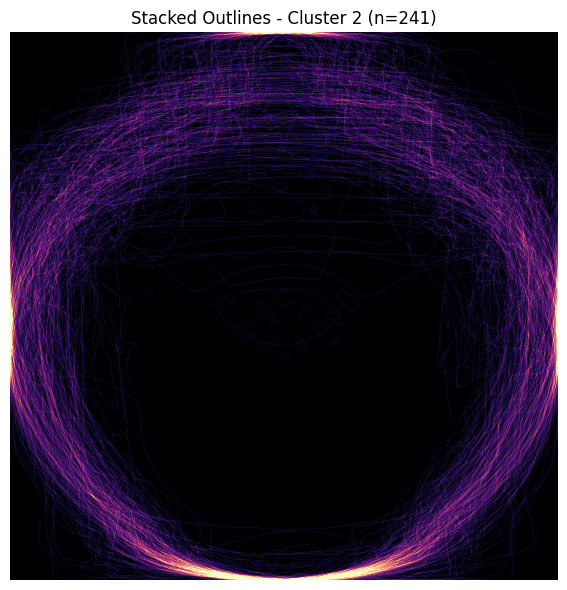

['191780', '195209', '200734', '200839', '200840', '200841', '201250', '201881', '202191', '202967', '203266', '204370', '204392', '204423', '206107', '206328', '206433', '207477', '207815', '208009', '208403', '208439', '210783', '307865', '307866', '308294', '308298', '308301', '308350', '308362']
config=k12_tb020, cluster=0, n=279


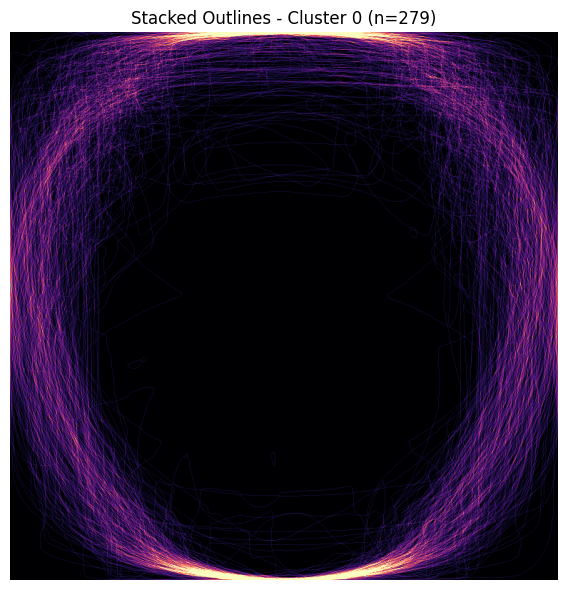

['195208', '198433', '198780', '198781', '199343', '199372', '199470', '199740', '200875', '200876', '201290', '201756', '208121', '208122', '208248', '208554', '307615', '308348', '308359', '308420', '308441', '308457', '308492', '308531', '308577', '308578', '308585', '308590', '308591', '308719']
config=k12_tb020, cluster=9, n=395


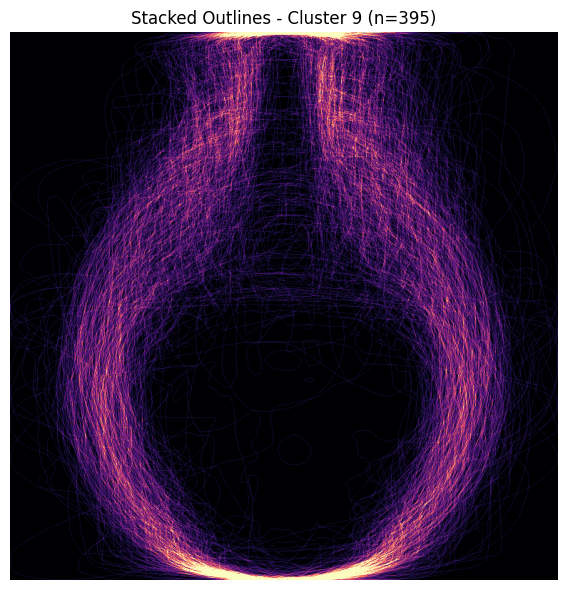

['188765', '188900', '190600', '190647', '192308', '194291', '194304', '194475', '194583', '194588', '194589', '194590', '195217', '197612', '198963', '199110', '200823', '200869', '200921', '200944', '201762', '202192', '202193', '202243', '202581', '204046', '204047', '204062', '204071', '205087']
config=k12_tb020, cluster=5, n=211


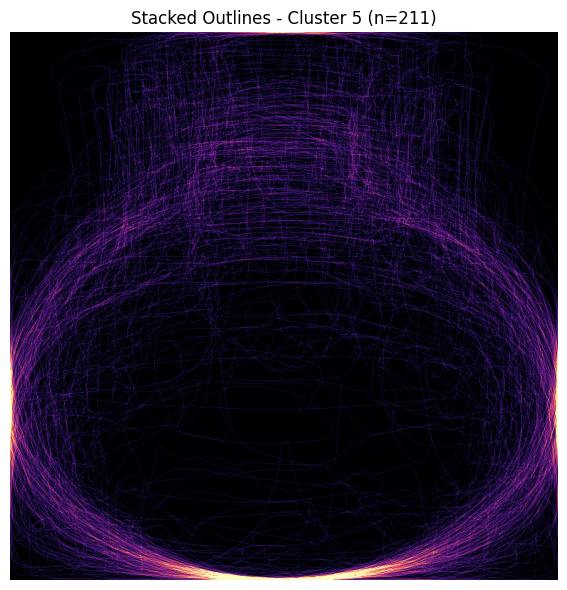

['187863', '192949', '199021', '199601', '200868', '201359', '201394', '201730', '201732', '202205', '203304', '205979', '207145', '207152', '207153', '207247', '208459', '307614', '307619', '307620', '307622', '307863', '307864', '307868', '308291', '308292', '308293', '308296', '308297', '308300']
config=k12_tb020, cluster=4, n=101


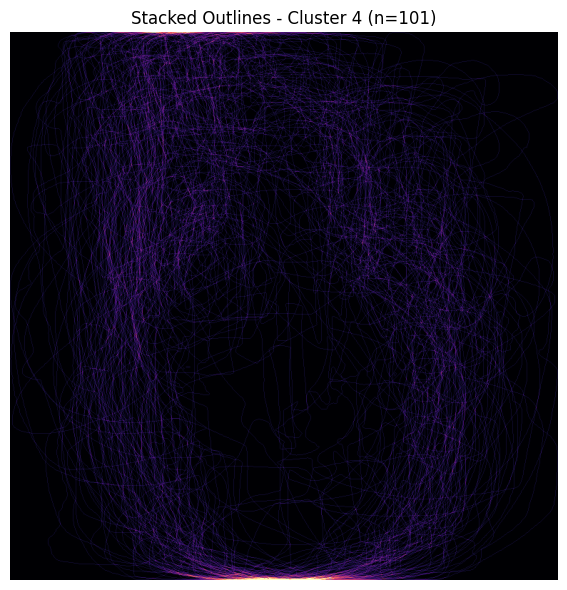

['185914', '187701', '191142', '194262', '195780', '197605', '199195', '199238', '199332', '199417', '200861', '201054', '201738', '203297', '203298', '203363', '204098', '205973', '206508', '206517', '207777', '208409', '208440', '208542', '307472', '308381', '308423', '308439', '308526', '308544']
config=k12_tb020, cluster=8, n=173


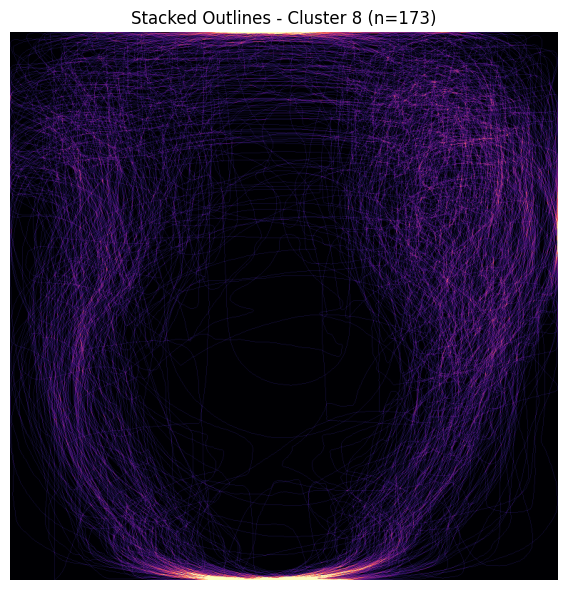

['188645', '188993', '188994', '192014', '193062', '193063', '193064', '193077', '193093', '193355', '194292', '194307', '194471', '194488', '194632', '194636', '194637', '194639', '194644', '194906', '195127', '195775', '197532', '197552', '197570', '197614', '197616', '198409', '198416', '198426']
config=k12_tb020, cluster=7, n=61


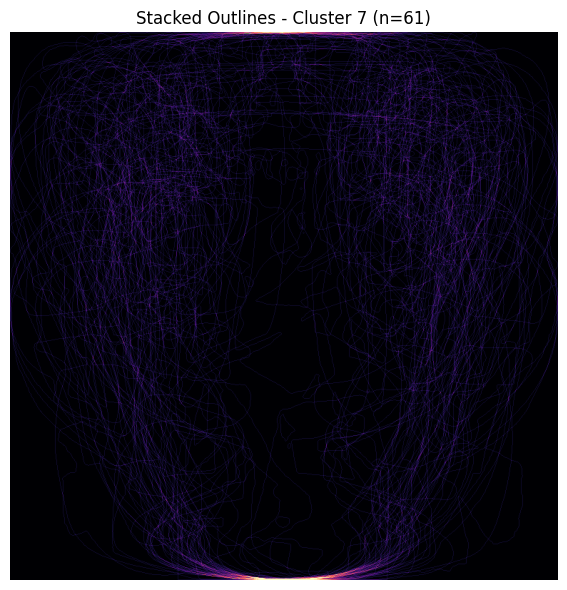

['185901', '186684', '187857', '187860', '188908', '191731', '194243', '194439', '194591', '195766', '196343', '196568', '197485', '198669', '198939', '199730', '199733', '199752', '203282', '203377', '204414', '204511', '204512', '204513', '206392', '207399', '208181', '39505', '39520', '444900']


In [ ]:
# ---- Direct comparison: (k=11, tb=0.20) vs (k=12, tb=0.20) ----

comparison_configs = [
    {"name": "k11_tb020", "k": 11, "tb_weight": 0.20},
    {"name": "k12_tb020", "k": 12, "tb_weight": 0.20},
]

comparison_outputs = {}
rows_summary = []

for cfg in comparison_configs:
    X_cfg, cols_cfg, _, _, _ = build_weighted_matrix(
        df,
        groups,
        lr_weight=1.0,
        tb_weight=cfg["tb_weight"],
        shape_weight=1.0,
        inner_weight=1.0,
    )
    model_cfg, labels_cfg = fit_kmeans(X_cfg, n_clusters=cfg["k"])
    metrics_cfg = evaluate_labels(X_cfg, labels_cfg)
    df_cfg = attach_labels(df, labels_cfg)
    compact_cfg = compute_cluster_compactness(X_cfg, labels_cfg)

    comparison_outputs[cfg["name"]] = {
        "cfg": cfg,
        "X": X_cfg,
        "labels": labels_cfg,
        "df_labeled": df_cfg,
        "compactness": compact_cfg,
        "metrics": metrics_cfg,
    }

    rows_summary.append(
        {
            "name": cfg["name"],
            "k": cfg["k"],
            "tb_weight": cfg["tb_weight"],
            **metrics_cfg,
            "top8_mean_dist": float(compact_cfg.head(8)["mean_dist_to_centroid"].mean()) if len(compact_cfg) >= 8 else np.nan,
        }
    )

summary_df = pd.DataFrame(rows_summary).sort_values(by=["silhouette", "davies_bouldin"], ascending=[False, True])
print("Overall config summary:")
display(summary_df)

# Build direct compactness/size comparison table by compactness rank position.
left = comparison_outputs["k11_tb020"]["compactness"].reset_index(drop=True).copy()
left["rank"] = np.arange(1, len(left) + 1)
left = left.rename(
    columns={
        "cluster": "k11_cluster",
        "size": "k11_size",
        "mean_dist_to_centroid": "k11_mean_dist",
        "median_dist_to_centroid": "k11_median_dist",
        "p90_dist_to_centroid": "k11_p90_dist",
    }
)

right = comparison_outputs["k12_tb020"]["compactness"].reset_index(drop=True).copy()
right["rank"] = np.arange(1, len(right) + 1)
right = right.rename(
    columns={
        "cluster": "k12_cluster",
        "size": "k12_size",
        "mean_dist_to_centroid": "k12_mean_dist",
        "median_dist_to_centroid": "k12_median_dist",
        "p90_dist_to_centroid": "k12_p90_dist",
    }
)

comparison_table = pd.merge(left, right, on="rank", how="outer")
print("Compactness/size comparison by rank (lower distance is tighter):")
display(comparison_table)

# Automatic overlay loops for both configs
for cfg_name in ["k11_tb020", "k12_tb020"]:
    print("\n" + "#" * 90)
    print(f"Overlay review for config: {cfg_name}")
    df_cfg = comparison_outputs[cfg_name]["df_labeled"]
    compact_cfg = comparison_outputs[cfg_name]["compactness"]

    print("Top compact clusters first:")
    ordered_clusters = compact_cfg["cluster"].tolist()

    for cluster_id in ordered_clusters:
        print("=" * 80)
        n_cluster = len(df_cfg[df_cfg["cluster"] == cluster_id])
        print(f"config={cfg_name}, cluster={cluster_id}, n={n_cluster}")

        _ = stack_cluster_outlines(
            df_cfg,
            cluster_id=int(cluster_id),
            real_images_dir=REAL_IMAGES_DIR,
            max_images=None,
            alpha_per_image=0.08,
        )

        sample_ids = (
            df_cfg.loc[df_cfg["cluster"] == cluster_id, "object_id"]
            .astype(str)
            .head(30)
            .tolist()
        )
        print(sample_ids)